In [2]:
import os
import torch
from torch import nn,optim
import torch.nn.functional as F
from torch.utils.data import DataLoader,Dataset,random_split
from torchsummary import summary
from PIL import Image
import matplotlib.pyplot as plt
from xml.etree import ElementTree as ET
import numpy as np
from torchvision import transforms
from skimage import io
from tqdm.auto import tqdm
import torchvision.transforms.functional as TF
from mpl_toolkits.axes_grid1 import ImageGrid
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import matplotlib.image as mpimg
import numpy as np
from math import floor

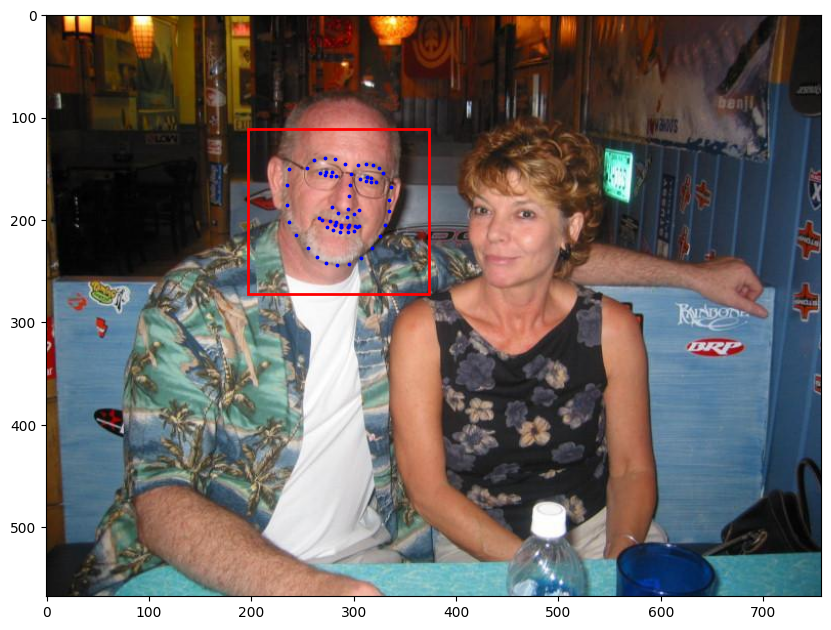

In [3]:


def plot_landmarks(image_path, landmarks_path, point_size=10, color='red', buffer_ratio=0.05):
    # Open and read the landmarks file
    with open(landmarks_path) as file:
        points = file.readlines()[3:-1]  # Skip the first three lines and last line

    landmarks = []

    # Extract x and y coordinates, convert to integers
    for point in points:
        x, y = point.split(' ')
        landmarks.append([floor(float(x)), floor(float(y[:-1]))])  # Strip newline and convert to float

    landmarks = np.array(landmarks)

    # Create figure and axis
    fig, ax = plt.subplots(1, figsize=(10, 10))

    # Display the image
    image = mpimg.imread(image_path)
    image_height, image_width = image.shape[:2]  # Get image dimensions (height, width)
    ax.imshow(image)

    # Extract the x and y coordinates
    x_coords = landmarks[:, 0]
    y_coords = landmarks[:, 1]

    # Calculate the bounding box coordinates
    left = np.min(x_coords) 
    right = np.max(x_coords) 
    top = np.min(y_coords)
    bottom = np.max(y_coords)

    # Compute width and height of the bounding box
    width = right - left
    height = bottom - top
    
    buffer_x = image_width * buffer_ratio
    buffer_y = image_height * buffer_ratio

    # Adjust coordinates for the buffer
    left = max(0, left - buffer_x)
    right = min(image_width, right + buffer_x)
    top = max(0, top - buffer_y)
    bottom = min(image_height, bottom + buffer_y)

    # Update width and height with the buffer
    width = right - left
    height = bottom - top

    # Create a rectangle for the bounding box
    rect = patches.Rectangle((left, top), width, height, linewidth=2, edgecolor='r', facecolor='none')

    # Add the patch (bounding box) to the axis
    ax.add_patch(rect)

    # Plot the landmarks as points on the image
    ax.scatter(x_coords, y_coords, s=point_size, color=color)

    # Show the plot with the image, landmarks, and bounding box
    plt.show()
    
    

# Example usage
image_path = r'ibug_300W_large_face_landmark_dataset\afw\261068_1.jpg'
landmarks_path = r'ibug_300W_large_face_landmark_dataset\afw\261068_1.pts'

# Call the function with your image and landmark file
plot_landmarks(image_path, landmarks_path, point_size=3, color='blue')


In [25]:
class FaceLandmarksAugmentation:
    def __init__(self, image_dim, brightness, contrast, saturation, hue, face_offset, crop_offset, rotation_limit):
        # Initialization parameters
        self.image_dim = image_dim            #Target dimension for the image.
        self.face_offset = face_offset        #Padding around the detected face during cropping.
        self.crop_offset = crop_offset        #Additional resizing offset.
        self.rotation_limit = rotation_limit  #Maximum rotation angle for random rotation.

        '''Initializes a color jitter transformation using transforms.ColorJitter to adjust the brightness, contrast,
        saturation, and hue of the image.'''

        self.transform = transforms.ColorJitter(brightness, contrast, saturation, hue)

    def offset_crop(self, image, landmarks, crops_coordinates):

        ''' This method crops the image based on given facial crop coordinates (crops_coordinates),
        modifies the facial landmarks accordingly, and resizes the image.'''


        '''Extracts the left, top, width, and height values from crops_coordinates,
        adding or subtracting face_offset to include padding around the face.'''

        left = int(crops_coordinates['left']) - self.face_offset
        top = int(crops_coordinates['top']) - self.face_offset
        width = int(crops_coordinates['width']) + (2 * self.face_offset)
        height = int(crops_coordinates['height']) + (2 * self.face_offset)

        image = TF.crop(image, top, left, height, width)
        landmarks = landmarks - np.array([[left, top]])  #making the landmarks relative to this new cropped image's coordinate system.

        # Adjusting the dimension of the cropped image
        new_dim = self.image_dim + self.crop_offset
        image = TF.resize(image, (new_dim, new_dim))

        # Scaling landmarks according to the new dimensions
        #This adjustment is necessary to maintain the correct placement of landmarks after the image has been resized from its original dimensions.
        landmarks[:, 0] *= new_dim / width
        landmarks[:, 1] *= new_dim / height

        return image, landmarks

    def random_face_crop(self, image, landmarks):
        # Converting the image to a NumPy array for manipulation
        image = np.array(image)

        # Get the height and width of the image
        h, w = image.shape[:2]

        # Randomly selecting the top-left corner for the crop,Ensuring the crop is within the limit
        top = np.random.randint(0, h - self.image_dim)
        left = np.random.randint(0, w - self.image_dim)

        # Cropping the image
        image = image[top: top + self.image_dim, left: left + self.image_dim]
        landmarks = landmarks - np.array([[left, top]])

        # Returning as PIL image and updated landmarks
        return TF.to_pil_image(image), landmarks

    def random_rotation(self, image, landmarks):
        # Generating a random rotation angle
        angle = np.random.uniform(-self.rotation_limit, self.rotation_limit)

        # Creating a rotation transformation matrix
        landmarks_transformation = np.array([
            [+np.cos(np.radians(angle)), -np.sin(np.radians(angle))],
            [+np.sin(np.radians(angle)), +np.cos(np.radians(angle))]
        ])

        # Rotating the image by the generated angle
        image = TF.rotate(image, angle)

        # Transforming landmarks by the rotation matrix
        '''Assuming the landmark coordinates are normalized (i.e., they range from 0 to 1),
        subtracting 0.5 will change the coordinate system to be centered around (0.5, 0.5), which is the center of the image in normalized coordinates.'''

        landmarks = landmarks - 0.5  #This adjusts the landmarks by shifting them so that the origin (0, 0) is at the center of the coordinate system. This is done to apply the rotation around the center of the landmarks.
        transformed_landmarks = np.matmul(landmarks, landmarks_transformation)
        transformed_landmarks = transformed_landmarks + 0.5  # Re-centering after transformation

        return image, transformed_landmarks

    def __call__(self, image, landmarks, crops_coordinates):
        # Apply offset cropping first
        image, landmarks = self.offset_crop(image, landmarks, crops_coordinates)

        # Apply random cropping after offset cropping
        image, landmarks = self.random_face_crop(image, landmarks)

        # Apply random rotation on the cropped image and landmarks
        image, landmarks = self.random_rotation(image, landmarks)

        # Apply color jitter transformation
        return self.transform(image), landmarks

In [26]:
class Preprocessor:
    def __init__(self,
                 image_dim,
                 brightness,
                 contrast,
                 saturation,
                 hue,
                 rotation_limit,
                 face_offset,
                 crop_offset):

        self.image_dim = image_dim

        # Initialize the combined FaceLandmarksAugmentation class

        self.face_landmarks_augmentation = FaceLandmarksAugmentation(
            image_dim=image_dim,
            brightness=brightness,
            contrast=contrast,
            saturation=saturation,
            hue=hue,
            face_offset=face_offset,
            crop_offset=crop_offset,
            rotation_limit=rotation_limit
        )

    def __call__(self, image, landmarks, crops_coordinates):
        # Convert image to PIL if it's in NumPy format
        image = TF.to_pil_image(image)

        # Perform the full augmentation (face cropping, random cropping, random rotation, color jitter)
        image, landmarks = self.face_landmarks_augmentation.offset_crop(image, landmarks, crops_coordinates)
        image, landmarks = self.face_landmarks_augmentation.random_face_crop(image, landmarks)


        # Normalize landmarks by the image size (scaling them to be relative to the image dimensions)
        landmarks = landmarks / np.array([*image.size])
        image, landmarks = self.face_landmarks_augmentation.random_rotation(image, landmarks)

        # Convert the image to grayscale
        image = TF.to_grayscale(image)

        # Convert the image to a tensor
        image = TF.to_tensor(image)

        # Normalize the image to the range [-1, 1]
        image = (image - image.min()) / (image.max() - image.min())  # Normalize to [0, 1]
        image = (2 * image) - 1  # Scale to [-1, 1],This is a common practice in deep learning to center the data around zero and improve model performance.


        return image, torch.FloatTensor(landmarks.reshape(-1) - 0.5)   #shifts the coordinates to be centered around zero. This adjustment ensures that landmarks are in the range [-0.5, 0.5], which can help with model convergence.


In [27]:
class datasetlandmark(Dataset):
  def __init__(self,Preprocessor,train):
     self.rootdir= r''
     self.imagepath=[]
     self.landmarks=[]
     self.crops_coordinates=[]
     self.preprocessor=Preprocessor
     self.train=train

     '''Parsing the xml tree to extract the data from the dataset'''

     tree=ET.parse(os.path.join(self.rootdir,f'labels_ibug_300W_{"train" if train else "test"}.xml'))
     root=tree.getroot()
     for child in root[2]:
       self.imagepath.append(os.path.join(self.rootdir,child.attrib['file']))
       self.crops_coordinates.append(child[0].attrib)
       landmark=[]
       for i in range(68):
          x_coordinate=int(child[0][i].attrib['x'])
          y_coordinate=int(child[0][i].attrib['y'])
          landmark.append([x_coordinate,y_coordinate])
       self.landmarks.append(landmark)
     self.landmarks=np.array(self.landmarks).astype('float32')

  def __len__(self):
    return len(self.imagepath)

  def __getitem__(self,index):
    image=io.imread(self.imagepath[index],as_gray=False)
    landmarks=self.landmarks[index]
    crops_coordinates=self.crops_coordinates[index]

    image,landmarks=self.preprocessor(image,landmarks,crops_coordinates)
    
    #print(f"Image shape: {image.shape}, Landmarks shape: {landmarks.shape}")

    return image,landmarks

In [28]:
def display_image(image, landmarks, image_dim):
    plt.figure(figsize=(5, 5))

    # Convert the image tensor to a NumPy array and adjust for display
    image = image.permute(1, 2, 0).numpy()  # Change shape from [C, H, W] to [H, W, C]
    
    # Rescale landmarks from [-0.5, 0.5] to [0, image_dim]
    landmarks = landmarks.view(-1, 2)
    landmarks = (landmarks + 0.5) * image_dim

    plt.imshow(image[0], cmap = 'gray')  # Display the image in color
    plt.scatter(landmarks[:, 0], landmarks[:, 1], s=20, c='red')  # Plot the landmarks on top of the image
    plt.axis('off')
    plt.show()
    
def visualizebatch(images_list, landmarks_list, size = 14, shape = (6, 6), title = None, save = None):
    fig = plt.figure(figsize = (size, size))
    grid = ImageGrid(fig, 111, nrows_ncols = shape, axes_pad = 0.08)
    for ax, image, landmarks in zip(grid, images_list, landmarks_list):
        image = (image - image.min())/(image.max() - image.min())

        landmarks = landmarks.view(-1, 2)
        landmarks = (landmarks + 0.5) * preprocessor.image_dim
        landmarks = landmarks.numpy().tolist()
        landmarks = np.array([(x, y) for (x, y) in landmarks if 0 <= x <= preprocessor.image_dim and 0 <= y <= preprocessor.image_dim])

        ax.imshow(image[0], cmap = 'gray')
        ax.scatter(landmarks[:, 0], landmarks[:, 1], s = 10, c = 'red')
        ax.axis('off')

    if title:
        print(title)
    if save:
        plt.savefig(save)
    plt.show()


In [29]:
preprocessor=Preprocessor(
                 image_dim=128,
                 brightness=0.24,
                 contrast=0.15,
                 saturation=0.3,
                 hue=0.14,
                 rotation_limit=14,
                 face_offset=32,
                 crop_offset=16)
trainimages=datasetlandmark(preprocessor,train=True)
testimages=datasetlandmark(preprocessor,train=False)

In [30]:
image1,landmarks1=trainimages[190]

In [31]:
total_images = len(trainimages)
lenval =int(0.1*total_images)
lentrain=total_images-lenval
print(f'{lentrain} images for training and {lenval} images for validation')
print(f'{len(testimages)} images for the testing')

6000 images for training and 666 images for validation
1008 images for the testing


In [32]:
## Split the training dataset into training and validation sets
trainimages,valimages=random_split(trainimages,[lentrain,lenval])
# Set the batch size
batchsize=32
# Create DataLoader objects for training, validation, and testing datasets
train_data=DataLoader(trainimages,batchsize,True)
val_data=DataLoader(valimages,2*batchsize,False)
test_data=DataLoader(testimages,2*batchsize,False)



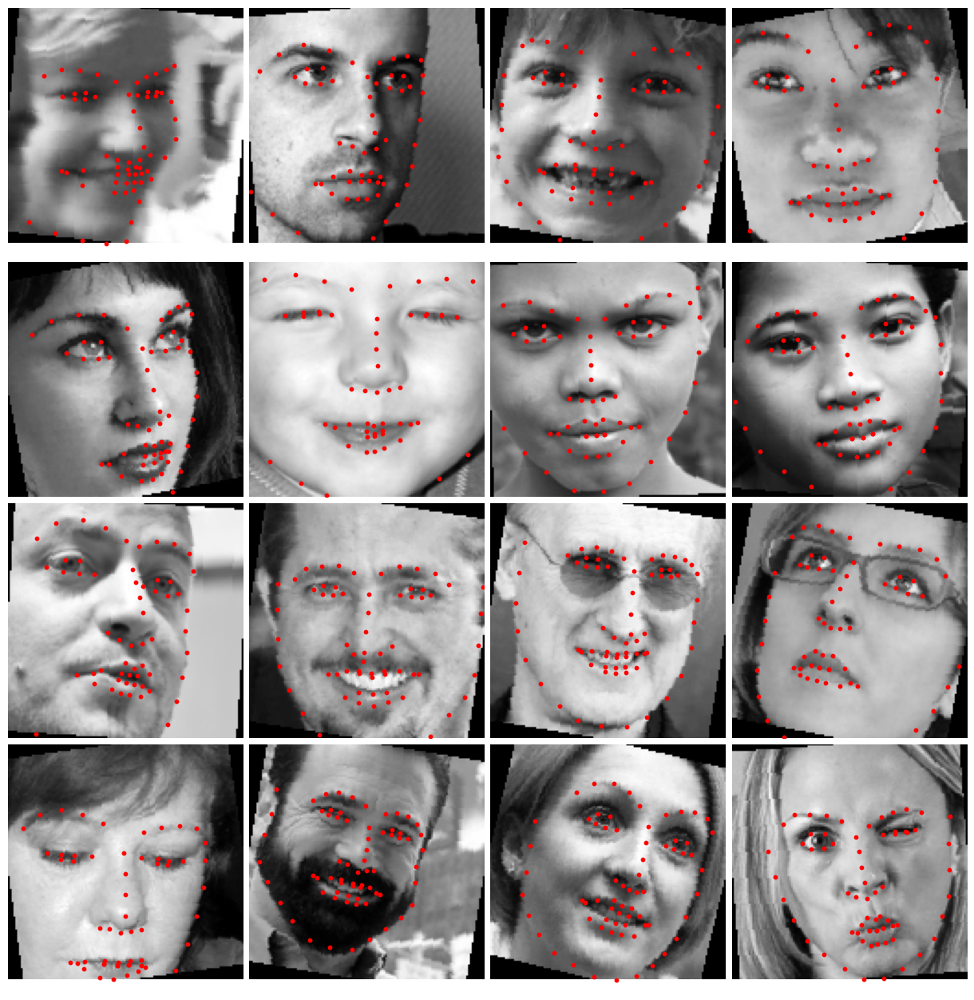

In [33]:
for x,y in train_data:
  break
visualizebatch(x[:16],y[:16],shape=(4,4),size=16)

In [34]:
class DepthwiseSeperableConv2d(nn.Module):
    def __init__(self, input_channels, output_channels, kernel_size, **kwargs):
        super(DepthwiseSeperableConv2d, self).__init__()

        self.depthwise = nn.Conv2d(input_channels, input_channels, kernel_size, groups = input_channels, bias = False, **kwargs)
        self.pointwise = nn.Conv2d(input_channels, output_channels, 1, bias = False)

    def forward(self, x):
        x = self.depthwise(x)
        x = self.pointwise(x)

        return x

In [35]:
class EntryBlock(nn.Module):
    def __init__(self):
        super(EntryBlock, self).__init__()

        self.conv1 = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding = 1, bias = False),
            nn.BatchNorm2d(32),
            nn.LeakyReLU(0.2)
        )

        self.conv2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding = 1, bias = False),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2)
        )

        self.conv3_residual = nn.Sequential(
            DepthwiseSeperableConv2d(64, 64, 3, padding = 1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(64, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.MaxPool2d(3, stride = 2, padding = 1),
        )

        self.conv3_direct = nn.Sequential(
            nn.Conv2d(64, 128, 1, stride = 2),
            nn.BatchNorm2d(128),
        )

        self.conv4_residual = nn.Sequential(
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(128, 128, 3, padding = 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(128, 256, 3, padding = 1),
            nn.BatchNorm2d(256),
            nn.MaxPool2d(3, stride = 2, padding = 1)
        )

        self.conv4_direct = nn.Sequential(
            nn.Conv2d(128, 256, 1, stride = 2),
            nn.BatchNorm2d(256),
        )

    def forward(self, x):
        x = self.conv1(x)
        x = self.conv2(x)

        residual = self.conv3_residual(x)
        direct = self.conv3_direct(x)
        x = residual + direct
        
        residual = self.conv4_residual(x)
        direct = self.conv4_direct(x)
        x = residual + direct

        return x

In [36]:
class MiddleBasicBlock(nn.Module):
    def __init__(self):
        super(MiddleBasicBlock, self).__init__()

        self.conv1 = nn.Sequential(
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(256, 256, 3, padding = 1),
            nn.BatchNorm2d(256)
        )
        self.conv2 = nn.Sequential(
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(256, 256, 3, padding = 1),
            nn.BatchNorm2d(256)
        )
        self.conv3 = nn.Sequential(
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(256, 256, 3, padding = 1),
            nn.BatchNorm2d(256)
        )

    def forward(self, x):
        residual = self.conv1(x)
        residual = self.conv2(residual)
        residual = self.conv3(residual)

        return x + residual


class MiddleBlock(nn.Module):
    def __init__(self, blocks_n):
        super().__init__()

        self.block = nn.Sequential(*[MiddleBasicBlock() for _ in range(blocks_n)])

    def forward(self, x):
        x = self.block(x)

        return x

In [37]:
class ExitBlock(nn.Module):
    def __init__(self):
        super(ExitBlock, self).__init__()

        self.residual = nn.Sequential(
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(256, 256, 3, padding = 1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(256, 512, 3, padding = 1),
            nn.BatchNorm2d(512),
            nn.MaxPool2d(3, stride = 2, padding = 1)
        )

        self.direct = nn.Sequential(
            nn.Conv2d(256, 512, 1, stride = 2),
            nn.BatchNorm2d(512)
        )

        self.conv = nn.Sequential(
            DepthwiseSeperableConv2d(512, 512, 3, padding = 1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            DepthwiseSeperableConv2d(512, 1024, 3, padding = 1),
            nn.BatchNorm2d(1024),
            nn.LeakyReLU(0.2)
        )

        self.dropout = nn.Dropout(0.3)

        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))

    def forward(self, x):
        direct = self.direct(x)
        residual = self.residual(x)
        x = direct + residual
        
        x = self.conv(x)
        x = self.avgpool(x)
        x = self.dropout(x)

        return x

In [38]:
class XceptionNet(nn.Module):
    def __init__(self, middle_block_n = 6):
        super(XceptionNet, self).__init__()

        self.entry_block = EntryBlock()
        self.middel_block = MiddleBlock(middle_block_n)
        self.exit_block = ExitBlock()

        self.fc = nn.Linear(1024, 136)

    def forward(self, x):
        x = self.entry_block(x)
        x = self.middel_block(x)
        x = self.exit_block(x)

        x = x.view(x.size(0), -1)
        
        x = self.fc(x)

        return x

In [39]:

model = XceptionNet() 
model.cuda()
# Move model to GPU if available
objective = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.00075)



validating:   0%|                                                                                             …

The loss for the epoch 1: 0.06199486790732904


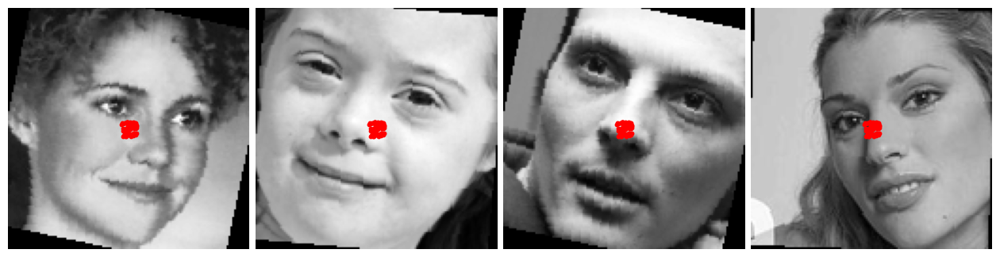

0.06199486790732904

In [40]:
'''
The validate function is used to
 evaluate the performance of model on a validation dataset.'''
@torch.no_grad()
def validate(epoch):
  tloss=0.0
  model.eval()

  for feature,labels in tqdm(val_data,desc='validating',ncols=600):
    feature=feature.cuda()
    labels=labels.cuda()

    output=model(feature)
    loss=objective(output,labels)
  
    tloss+=loss.item()
  print(f"The loss for the epoch {epoch}: {tloss/len(val_data)}")
  visualizebatch(feature[:4].cpu(),output[:4].cpu(),shape=(1,4),size=16)
  return tloss/len(val_data)


validate(epoch=1)

epoch(1/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 0: 0.005025375168770552


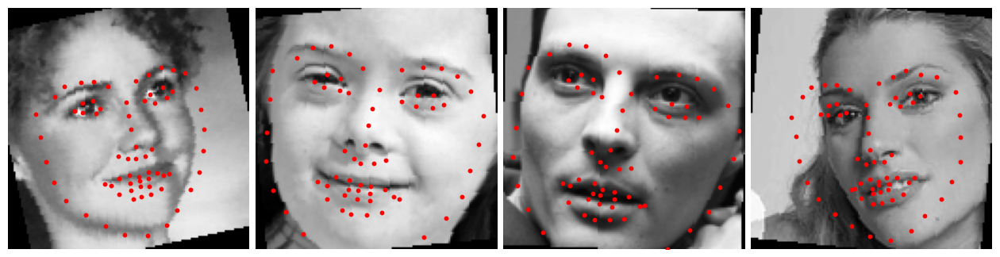

epoch(1/50) -> training Loss: 0.00593966 | validation loss: 0.00502538


epoch(2/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 1: 0.002115386157211932


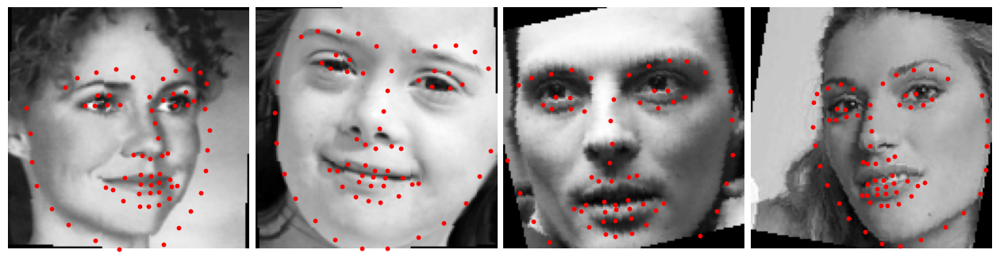

epoch(2/50) -> training Loss: 0.00340221 | validation loss: 0.00211539


epoch(3/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 2: 0.002770856022834778


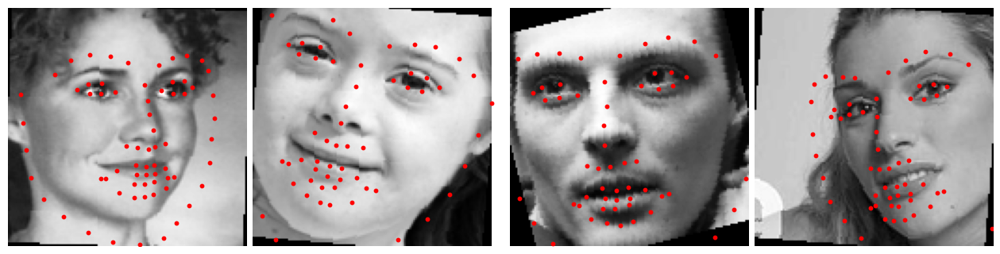

epoch(3/50) -> training Loss: 0.00237142 | validation loss: 0.00277086


epoch(4/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 3: 0.0016773072367703373


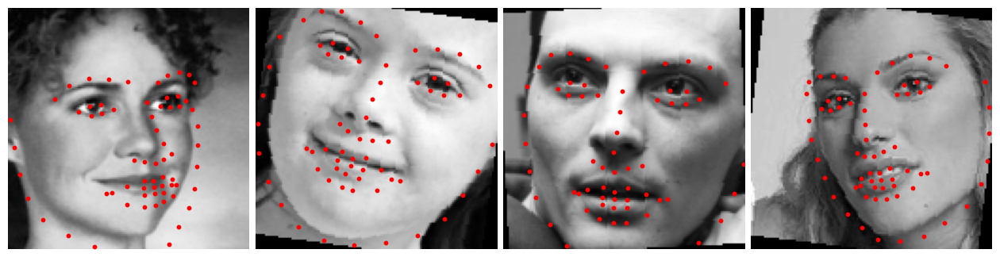

epoch(4/50) -> training Loss: 0.00193074 | validation loss: 0.00167731


epoch(5/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 4: 0.0011936613538471813


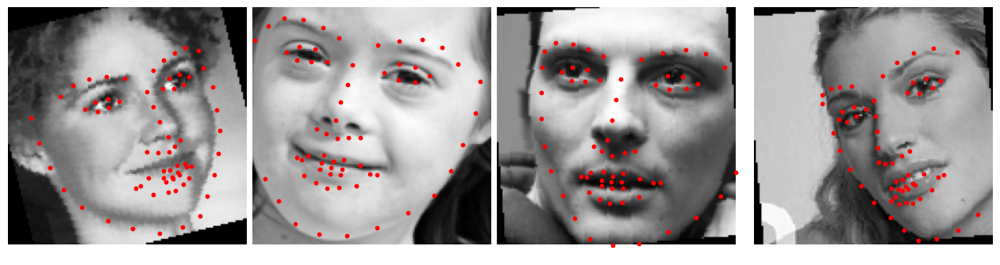

epoch(5/50) -> training Loss: 0.00161953 | validation loss: 0.00119366


epoch(6/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 5: 0.0011388912945139136


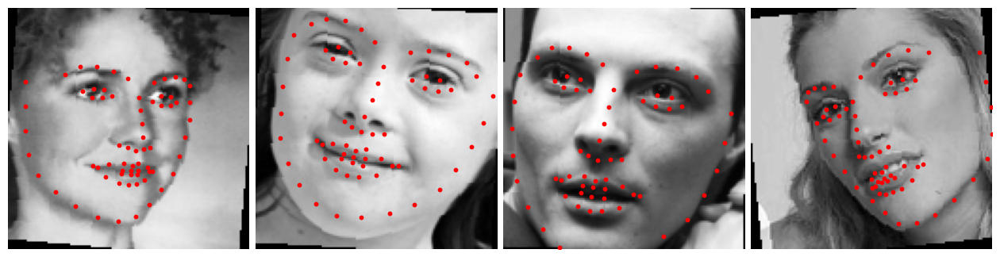

epoch(6/50) -> training Loss: 0.00157734 | validation loss: 0.00113889


epoch(7/50):   0%|                                                                                            …

The loss for the epoch 7: 0.000989893107378686


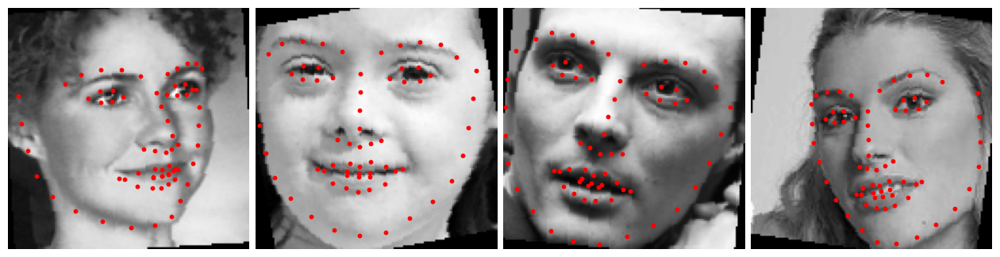

epoch(8/50) -> training Loss: 0.00133714 | validation loss: 0.00098989


epoch(9/50):   0%|                                                                                            …

validating:   0%|                                                                                             …

The loss for the epoch 8: 0.0009008609393442219


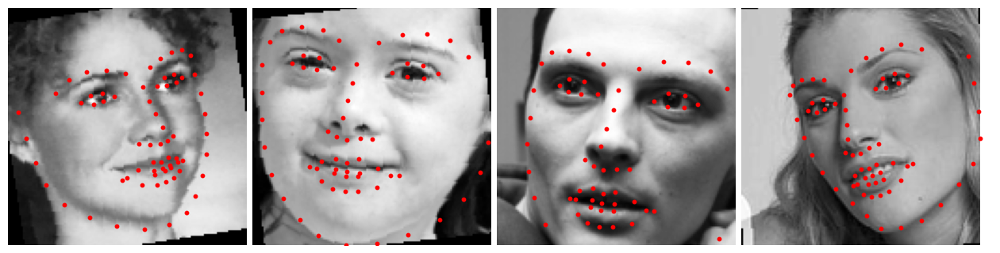

epoch(9/50) -> training Loss: 0.00120879 | validation loss: 0.00090086


epoch(10/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 9: 0.001428426804274998


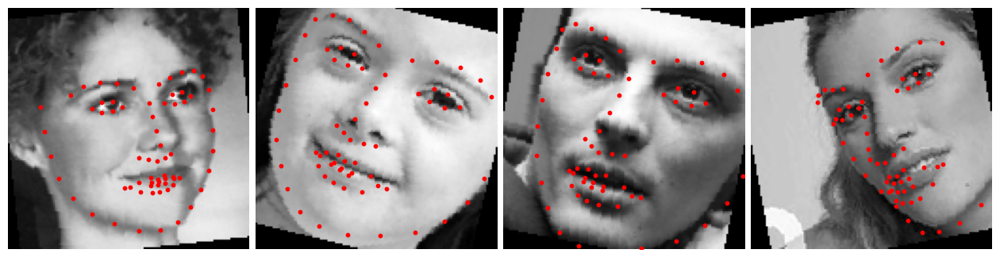

epoch(10/50) -> training Loss: 0.00119506 | validation loss: 0.00142843


epoch(11/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 10: 0.00074491131817922


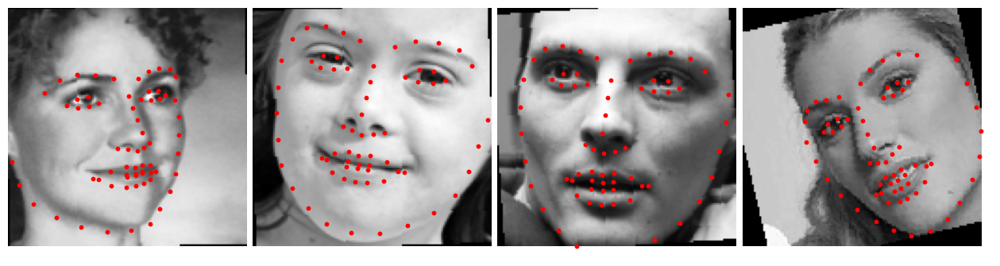

epoch(11/50) -> training Loss: 0.00105717 | validation loss: 0.00074491


epoch(12/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 11: 0.0015087544769895348


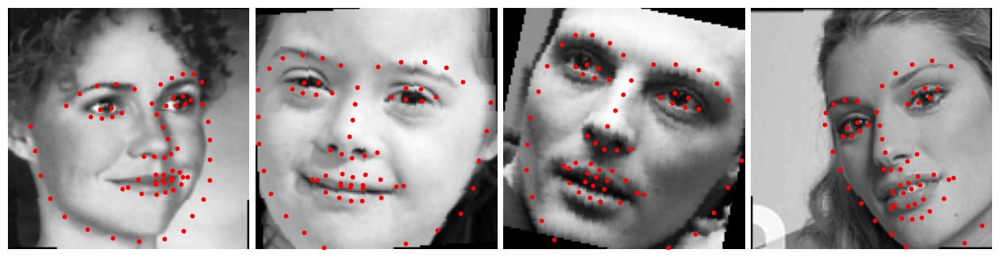

epoch(12/50) -> training Loss: 0.00098710 | validation loss: 0.00150875


epoch(13/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 12: 0.0009369703052057462


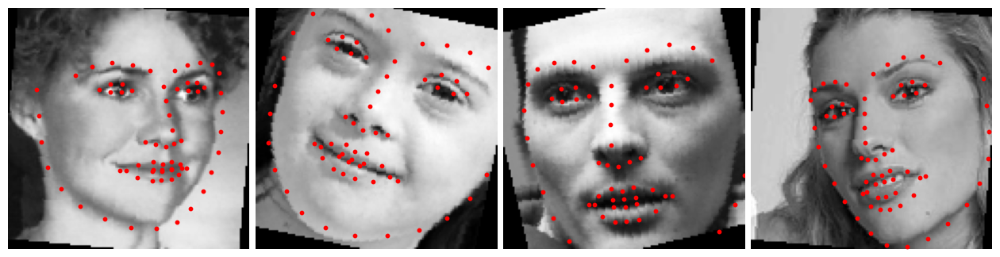

epoch(13/50) -> training Loss: 0.00099735 | validation loss: 0.00093697


epoch(14/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 13: 0.0013190799032930624


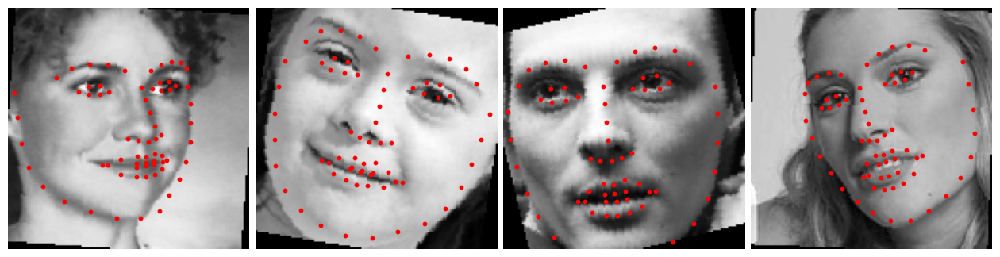

epoch(14/50) -> training Loss: 0.00098561 | validation loss: 0.00131908


epoch(15/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 14: 0.00069520390719514


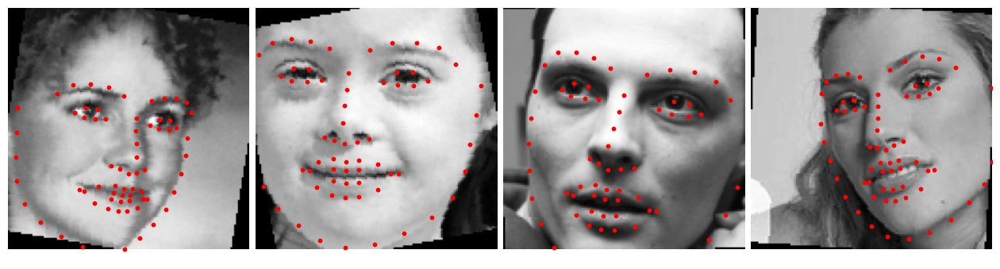

epoch(15/50) -> training Loss: 0.00092072 | validation loss: 0.00069520


epoch(16/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 15: 0.0008068580063991249


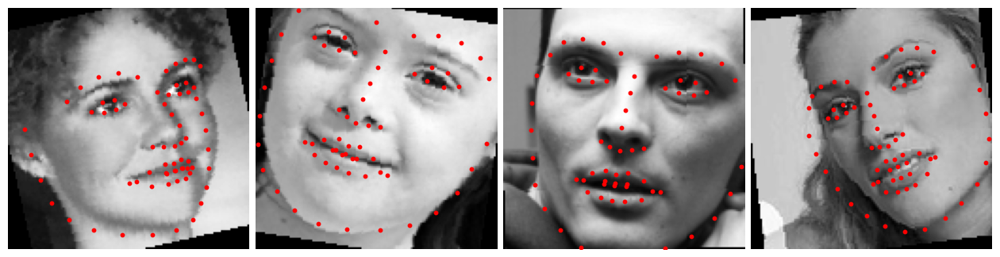

epoch(16/50) -> training Loss: 0.00087217 | validation loss: 0.00080686


epoch(17/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 16: 0.0008454091148450971


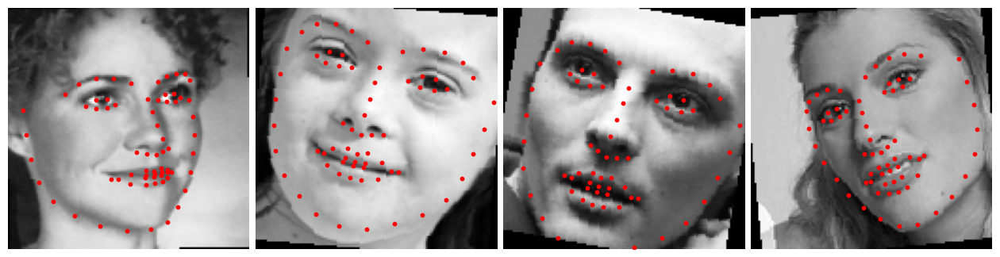

epoch(17/50) -> training Loss: 0.00082731 | validation loss: 0.00084541


epoch(18/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 17: 0.0008187133564867756


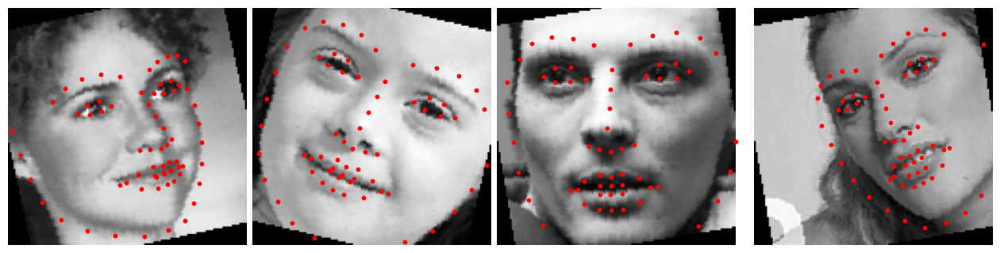

epoch(18/50) -> training Loss: 0.00080255 | validation loss: 0.00081871


epoch(19/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 18: 0.0010219033310105178


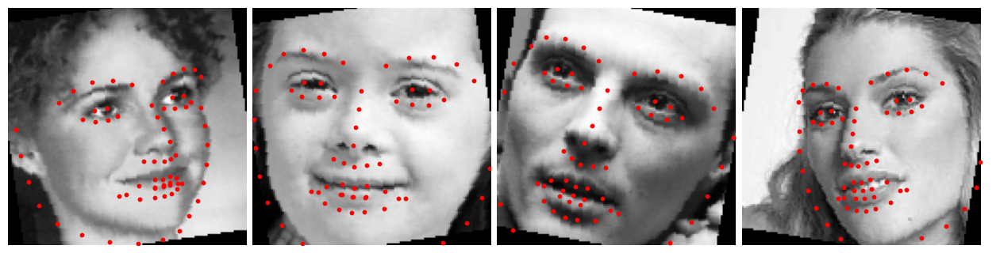

epoch(19/50) -> training Loss: 0.00078537 | validation loss: 0.00102190


epoch(20/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 19: 0.0012018583101135764


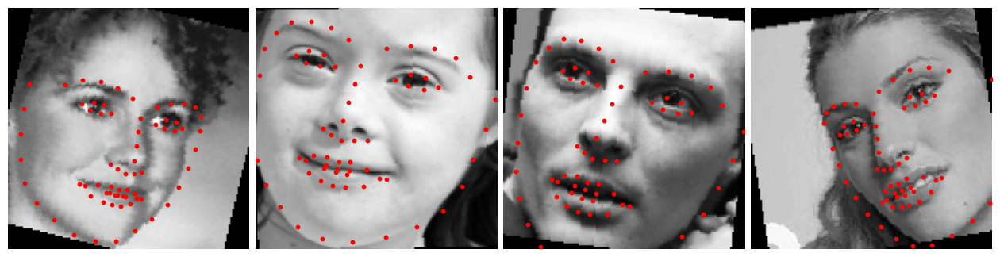

epoch(20/50) -> training Loss: 0.00079659 | validation loss: 0.00120186


epoch(21/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 20: 0.0005703092531555078


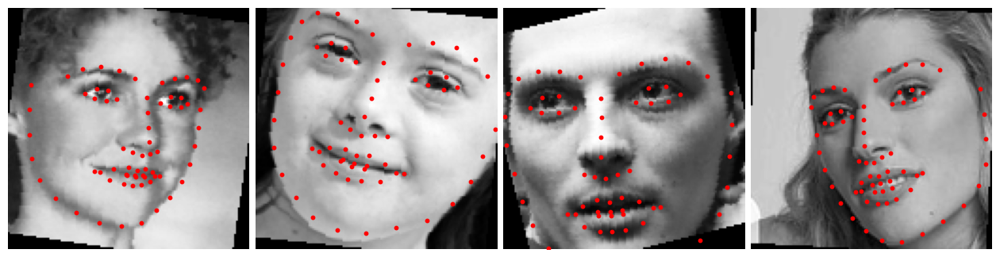

epoch(21/50) -> training Loss: 0.00075788 | validation loss: 0.00057031


epoch(22/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 21: 0.0008020814381201159


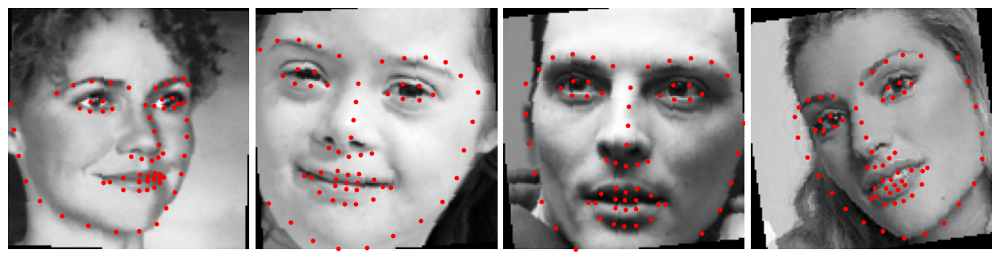

epoch(22/50) -> training Loss: 0.00070448 | validation loss: 0.00080208


epoch(23/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 22: 0.0006245415213263848


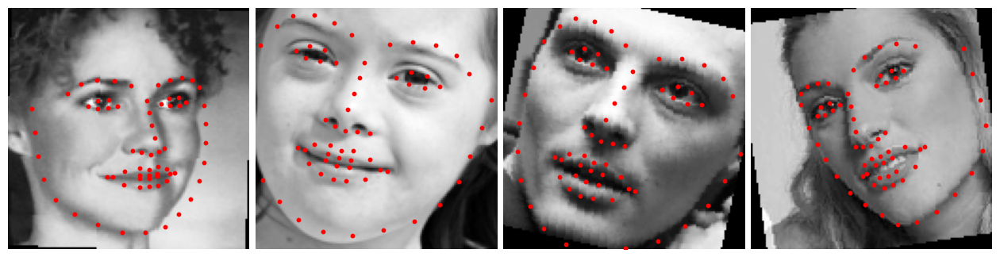

epoch(23/50) -> training Loss: 0.00067699 | validation loss: 0.00062454


epoch(24/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 23: 0.0006201587384566665


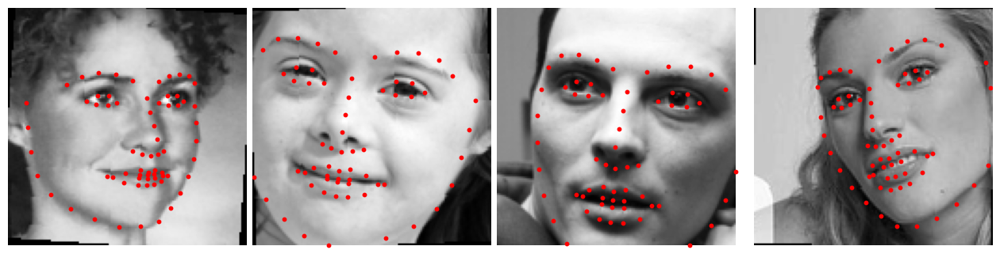

epoch(24/50) -> training Loss: 0.00069011 | validation loss: 0.00062016


epoch(25/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 24: 0.0011415626769038763


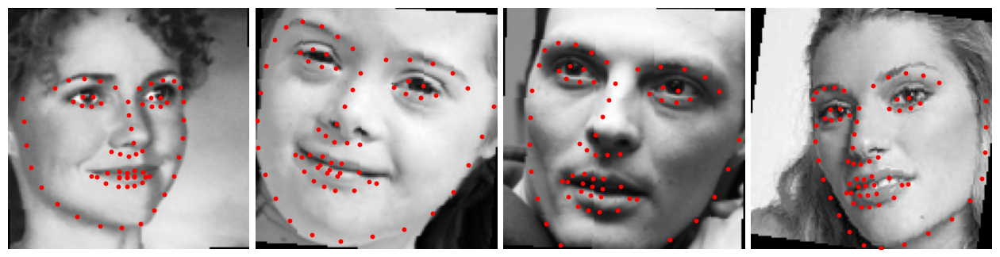

epoch(25/50) -> training Loss: 0.00067130 | validation loss: 0.00114156


epoch(26/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 25: 0.0006142998463474214


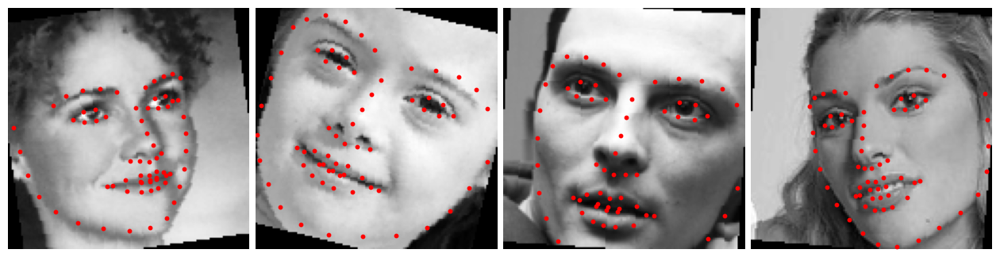

epoch(26/50) -> training Loss: 0.00066220 | validation loss: 0.00061430


epoch(27/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 26: 0.0008568943330002102


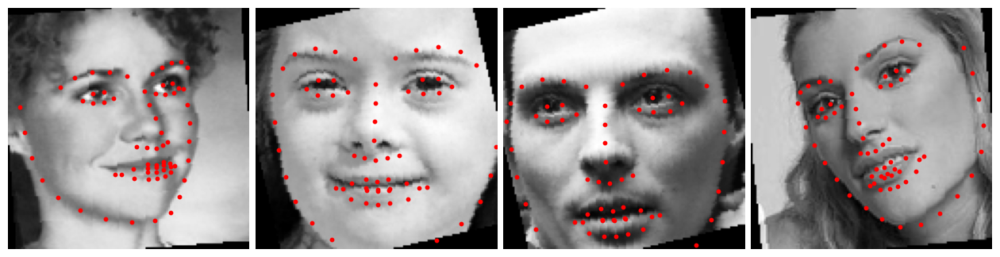

epoch(27/50) -> training Loss: 0.00063454 | validation loss: 0.00085689


epoch(28/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 28: 0.0006632090927186338


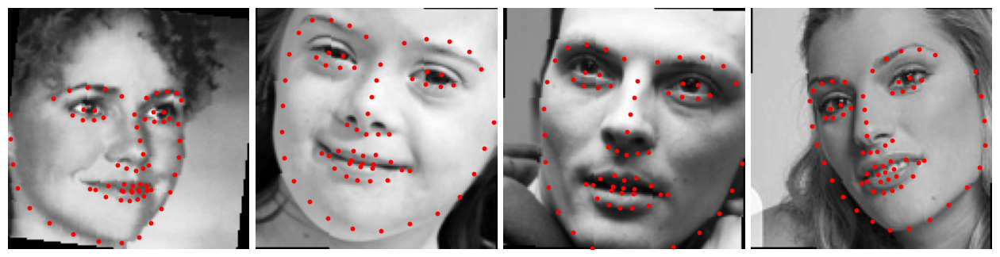

epoch(29/50) -> training Loss: 0.00059830 | validation loss: 0.00066321


epoch(30/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 29: 0.0006245360815558921


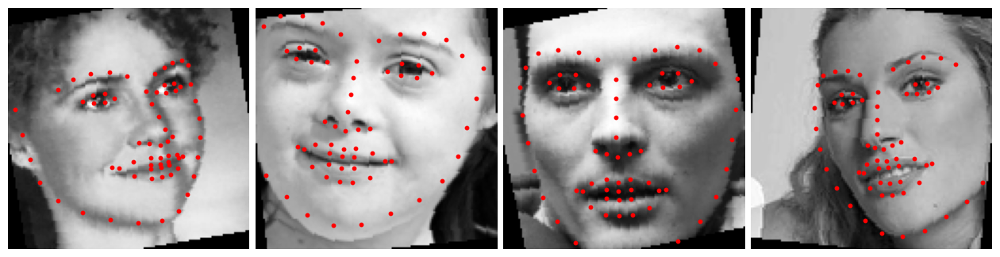

epoch(30/50) -> training Loss: 0.00058298 | validation loss: 0.00062454


epoch(31/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 30: 0.0005705352470448071


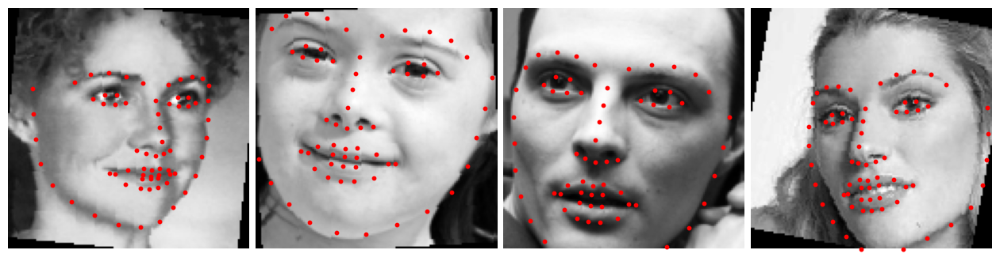

epoch(31/50) -> training Loss: 0.00058223 | validation loss: 0.00057054


epoch(32/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 31: 0.0007623665944927118


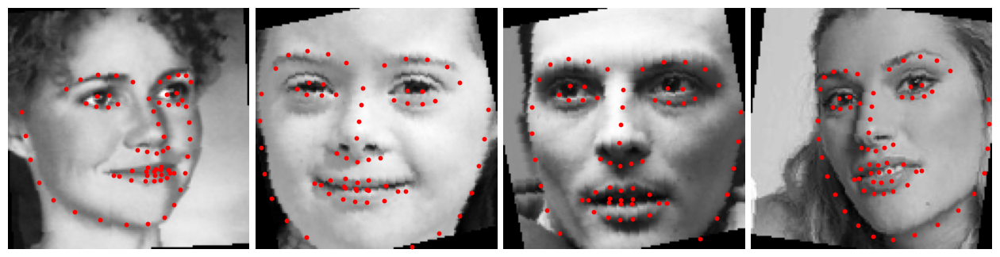

epoch(32/50) -> training Loss: 0.00058083 | validation loss: 0.00076237


epoch(33/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 32: 0.0007986571608026596


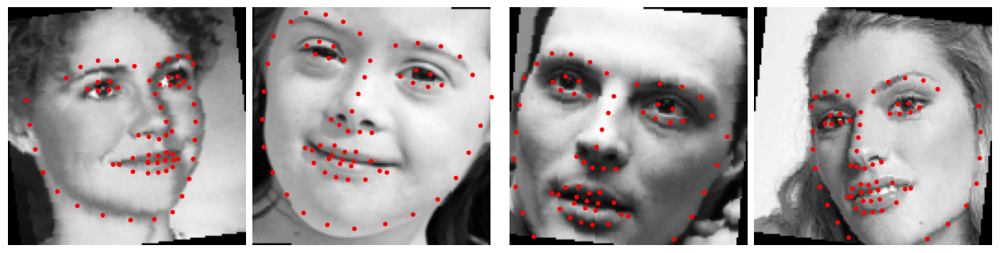

epoch(33/50) -> training Loss: 0.00057262 | validation loss: 0.00079866


epoch(34/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 33: 0.000515417026525194


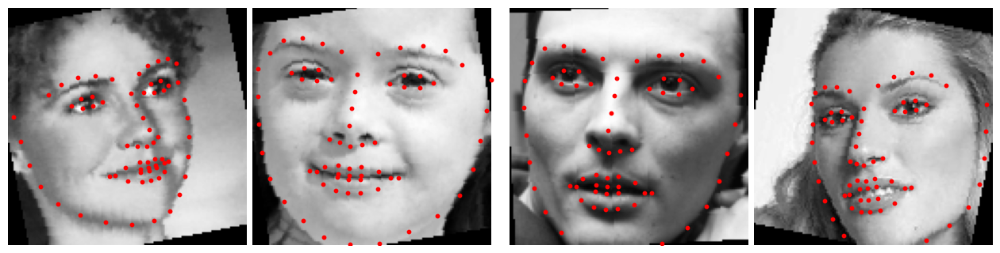

epoch(34/50) -> training Loss: 0.00054951 | validation loss: 0.00051542


epoch(35/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 34: 0.0005613772796509279


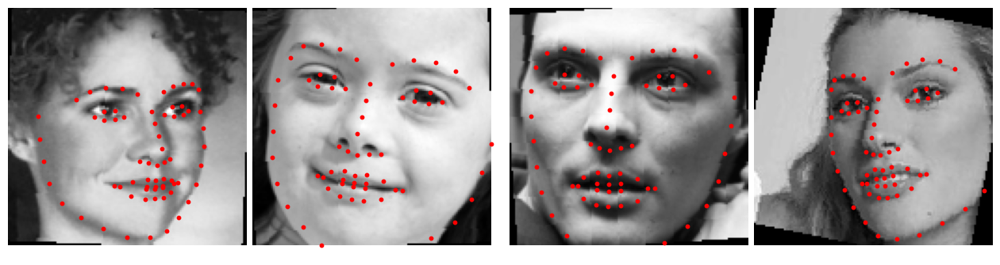

epoch(35/50) -> training Loss: 0.00053694 | validation loss: 0.00056138


epoch(36/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 35: 0.0007639221518977799


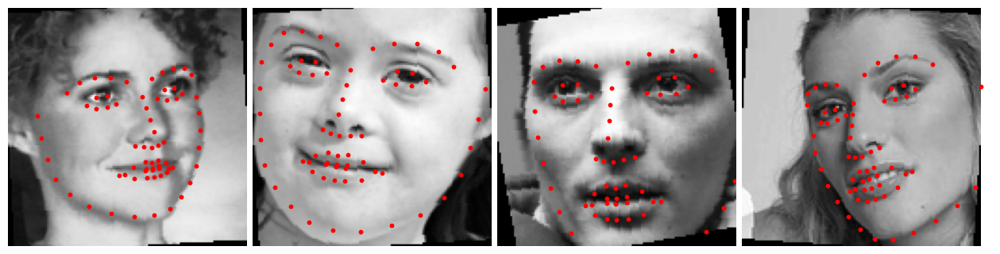

epoch(36/50) -> training Loss: 0.00054549 | validation loss: 0.00076392


epoch(37/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 36: 0.0007465862012891607


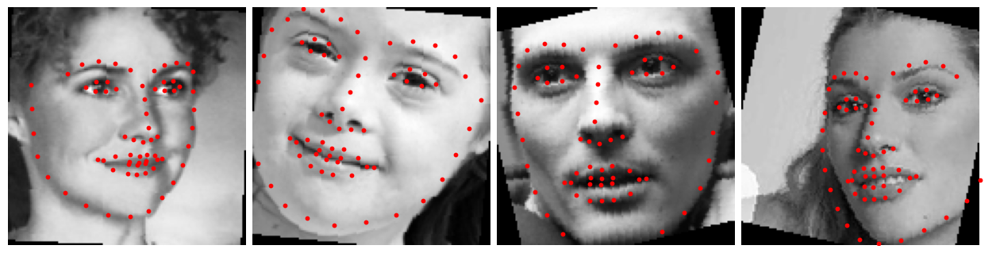

epoch(37/50) -> training Loss: 0.00051214 | validation loss: 0.00074659


epoch(38/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 37: 0.000580331387358125


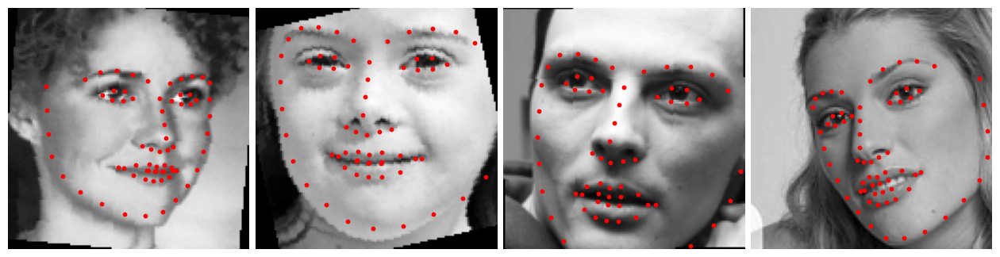

epoch(38/50) -> training Loss: 0.00050234 | validation loss: 0.00058033


epoch(39/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 38: 0.0006289807920852168


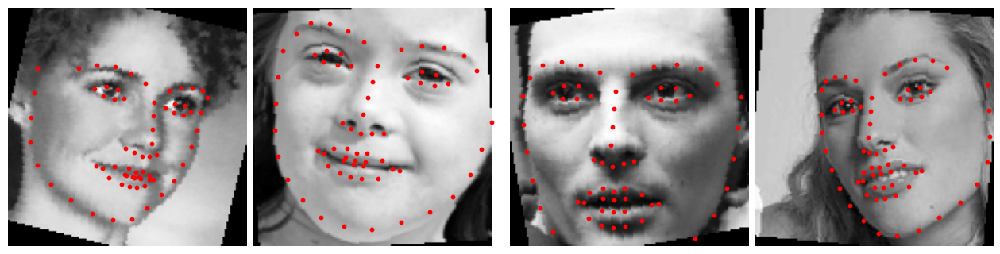

epoch(39/50) -> training Loss: 0.00049274 | validation loss: 0.00062898


epoch(40/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 39: 0.0005503656072753736


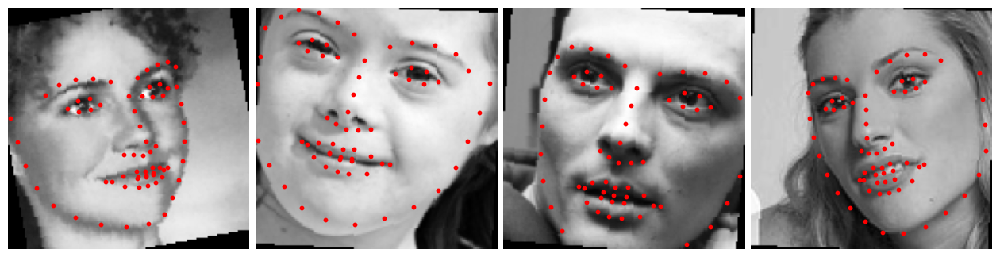

epoch(40/50) -> training Loss: 0.00049611 | validation loss: 0.00055037


epoch(41/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 40: 0.0006647683092689311


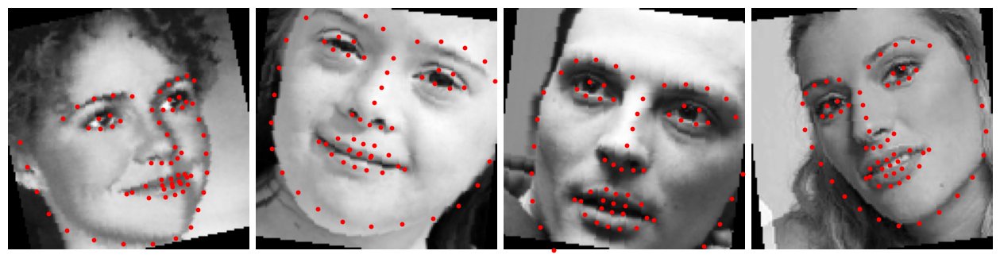

epoch(41/50) -> training Loss: 0.00048691 | validation loss: 0.00066477


epoch(42/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 41: 0.0006188316990367391


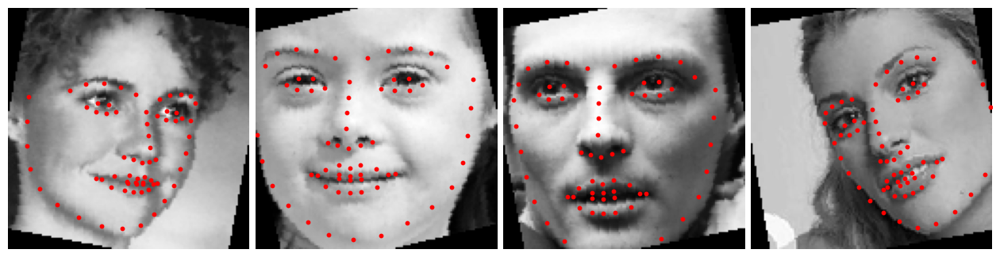

epoch(42/50) -> training Loss: 0.00049406 | validation loss: 0.00061883


epoch(43/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 42: 0.0006578263075260276


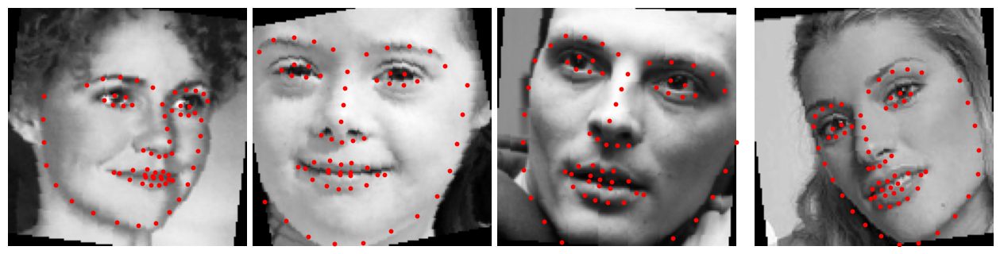

epoch(43/50) -> training Loss: 0.00046758 | validation loss: 0.00065783


epoch(44/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 43: 0.0005851648165844381


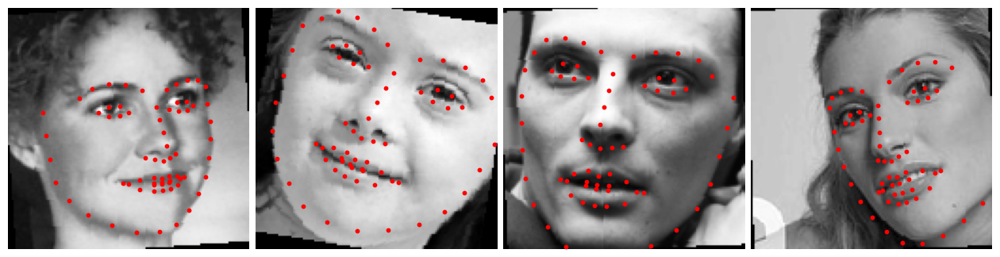

epoch(44/50) -> training Loss: 0.00048353 | validation loss: 0.00058516


epoch(45/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 44: 0.0006470309110062027


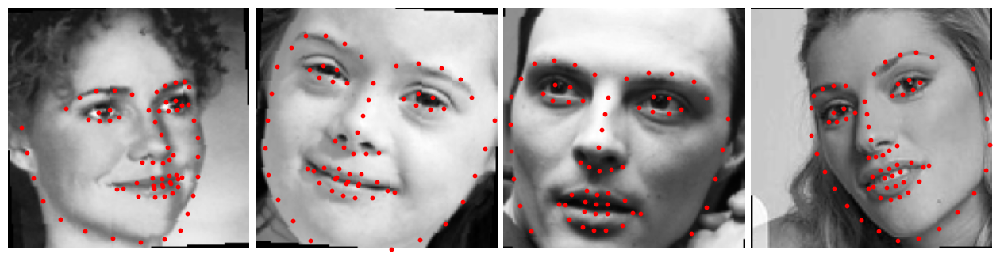

epoch(45/50) -> training Loss: 0.00045194 | validation loss: 0.00064703


epoch(46/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 45: 0.0005421563930047506


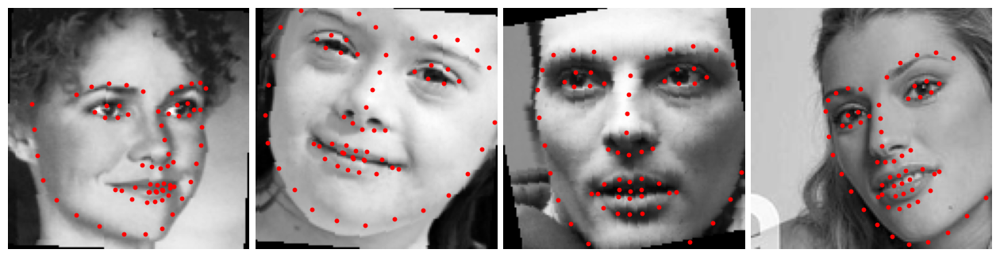

epoch(46/50) -> training Loss: 0.00046374 | validation loss: 0.00054216


epoch(47/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 46: 0.0006609098954041573


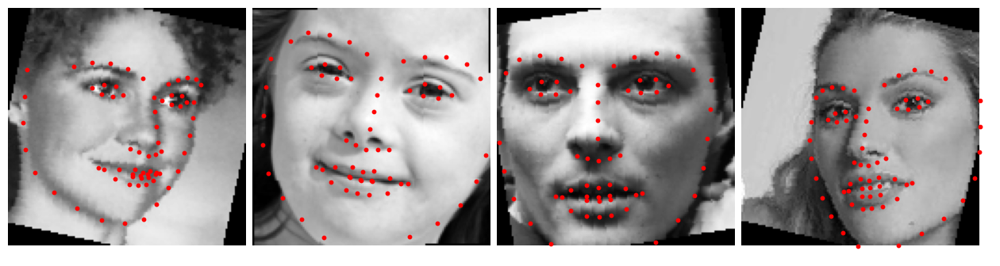

epoch(47/50) -> training Loss: 0.00044416 | validation loss: 0.00066091


epoch(48/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 47: 0.0006749363912438804


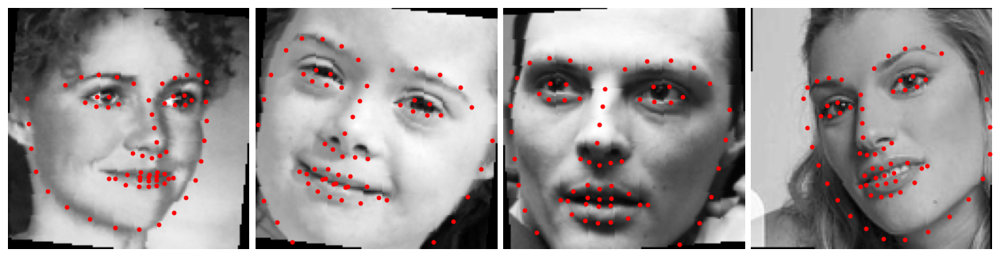

epoch(48/50) -> training Loss: 0.00046980 | validation loss: 0.00067494


epoch(49/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 48: 0.0005310329698576508


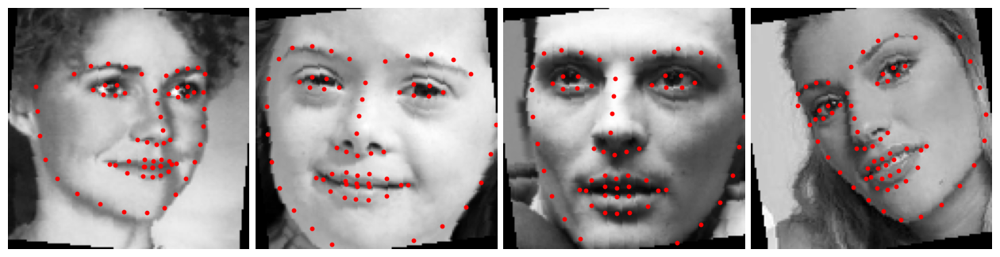

epoch(49/50) -> training Loss: 0.00045760 | validation loss: 0.00053103


epoch(50/50):   0%|                                                                                           …

validating:   0%|                                                                                             …

The loss for the epoch 49: 0.0005131113046610898


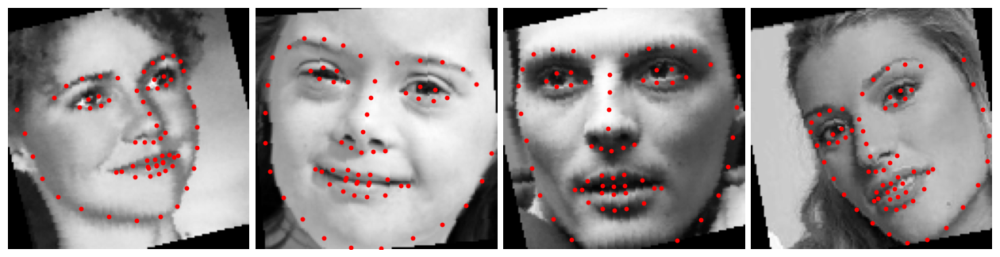

epoch(50/50) -> training Loss: 0.00042480 | validation loss: 0.00051311
Training complete. Model checkpoints saved in the current directory.


In [42]:


# Set training parameters
epochs = 50
batches = len(train_data)
updated_loss = np.inf

# Function to save model checkpoints
def save_checkpoint(model, optimizer, epoch, loss, best=False):
    state = {
        'epoch': epoch,
        'state_dict': model.state_dict(),
        'optimizer': optimizer.state_dict(),
        'loss': loss,
        'config': {
            'learning_rate': 0.00075,  # Example hyperparameter
            'batch_size': 32,         # Example hyperparameter
            'num_epochs': epochs               # Example hyperparameter
        }
    }
    filename = 'best_model.pt' if best else f'checkpoint_epoch_{epoch}.pt'
    torch.save(state, filename)  # Save model checkpoint

# Training loop
for epoch in range(epochs):
    total_loss = 0.0
    model.train()  # Set model to training mode
    for feature, labels in tqdm(train_data, desc=f'epoch({epoch + 1}/{epochs})', ncols=800):
        feature = feature.cuda()
        labels = labels.cuda()

        output = model(feature)
        loss = objective(output, labels)
        loss.backward()
        optimizer.step()
        optimizer.zero_grad()
        total_loss += loss.item()

    # Validate the model after each epoch
    val_loss = validate(epoch)  # Perform validation and get validation loss

    # Save the model checkpoint
    save_checkpoint(model, optimizer, epoch + 1, val_loss)  # Save at each epoch

    # Check if the current validation loss is the best so far
    if val_loss < updated_loss:
        updated_loss = val_loss
        save_checkpoint(model, optimizer, epoch + 1, val_loss, best=True)  # Save the best model

    # Print epoch statistics
    print(f'epoch({epoch + 1}/{epochs}) -> training Loss: {(total_loss / batches):.8f} | validation loss: {val_loss:.8f}')

# Optional: Print a message when training is complete
print("Training complete. Model checkpoints saved in the current directory.")
